In [163]:
# basic imports
from obspy.clients.fdsn import Client
from obspy import read
import obspy
import numpy as np
from obspy import UTCDateTime
import matplotlib.pyplot as plt
import matplotlib as mplt
import os
from sklearn.linear_model import LinearRegression
from IPython.display import Markdown as md
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures

import glob
from IPython.display import Image, display

%matplotlib inline

In [49]:
"""
The goal of this notebook is to figure out how much the side of mseed data files
varies w.r.t three variables: number of days of data, number of traces,
and sampling rate (Hz)

I will begin by examining DR02 over a 60 day period, plotting the size of each day's
data for a 3 stream, 1 Hz query to get an idea of the variation that we're dealing with.
"""

# defining constants
SECONDS_IN_A_DAY = 60 * 60 * 24
filepath = '60DayData/'
starttime = UTCDateTime('2015-01-17T11:00:00') # this is a relatively arbitrary start time
endtime = starttime + SECONDS_IN_A_DAY

# initializing data structures

"""
X: holds the file sizes for each day interval's data, X[i] holds
   the data for the i+1th day

y: holds the day #, with the indices shifted up by one
"""

X = []
y = np.array(list(range(1, 61)))

In [50]:
# define values for the data query
client = Client('IRIS')
net = 'XH'
sta = 'RS07'
chan = 'LH*'
loc = '--'

In [51]:
# defining a function to save the data to the 60DayData folder
def save_stream(st, filename):
    path = filepath + filename + ".mseed"
    st.write(filename=path, format="MSEED")

# loop to query the data for each of 60 days and save it in different files

"""
1. query the data for the correct time period
2. save the data in the correct file
3. update the start and endtimes
4. query the size of the file and put it in X[i]
"""
for i in range(1, 61):
#     querying for data
    st = client.get_waveforms(net, sta, loc, chan, starttime, endtime, attach_response = True)
    
#     saving stream to file
    save_stream(st, str(i))
    
#     updating start and end times
    starttime = endtime
    endtime = starttime + SECONDS_IN_A_DAY
    
#     saving the file size in data array
    X.append((os.path.getsize(filepath + str(i) + '.mseed'))/(1000000.))

[0.458752, 0.487424, 0.487424, 0.376832, 0.335872, 0.344064, 0.372736, 0.38912, 0.36864, 0.364544, 0.364544, 0.364544, 0.344064, 0.344064, 0.335872, 0.331776, 0.331776, 0.356352, 0.458752, 0.540672, 0.544768, 0.53248, 0.45056, 0.36864, 0.34816, 0.36864, 0.360448, 0.356352, 0.360448, 0.421888, 0.380928, 0.38912, 0.372736, 0.380928, 0.397312, 0.4096, 0.540672, 0.483328, 0.475136, 0.454656, 0.462848, 0.458752, 0.38912, 0.45056, 0.43008, 0.520192, 0.405504, 0.364544, 0.364544, 0.446464, 0.380928, 0.380928, 0.36864, 0.385024, 0.397312, 0.397312, 0.393216, 0.393216, 0.38912, 0.376832]


,DayNumber,SizeInMB
0,1,0.458752
1,2,0.487424
2,3,0.487424
3,4,0.376832
4,5,0.335872
5,6,0.344064
6,7,0.372736
7,8,0.389120
8,9,0.368640
9,10,0.364544


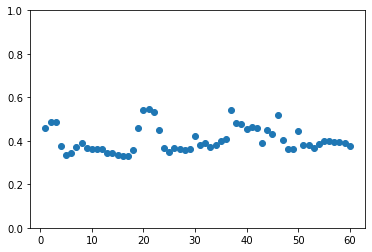

In [112]:
# validation of data
print(X)

# get basic scatter plot of the data
ax = plt.gca()
plt.scatter(y,X)
ax.set_ybound(0, 1)


# creation of a dataframe
frame = list(zip(y,X))
df = pd.DataFrame(frame, columns=['DayNumber','SizeInMB'])
df

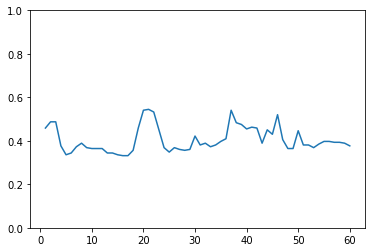

In [115]:
# get a line plot of the data
plt.plot(y,X)
ax = plt.gca()
ax.set_ybound(0, 1)

In [116]:
# there is a rough dividing line (just using the eye test, around 0.45 mB)
data = np.array(list(frame))
a = data[data[:,1]>0.45]
b = data[data[:,1]<=0.45]

# validating the split
print(len(a))
print(len(b))

# validating the data
print(a[1])
print(b[1])

16
44
[2.       0.487424]
[5.       0.335872]


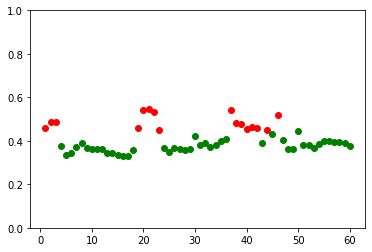

In [118]:
# get a divided scatter plot by the dividing threshold
ax = plt.gca()
plt.scatter(a[:,0], a[:,1], c='red')
plt.scatter(b[:,0], b[:,1], c='green')
ax.set_ybound(0, 1)

In [124]:
# we will now generate the spectrograms of 10 of the red points and 10 of the green points to compare
reds = np.random.choice(a[:,0], size=10, replace=False)
greens = np.random.choice(b[:,0], size=10, replace=False)

print(reds)
print(greens)

[40. 44. 20. 41. 42.  1. 37. 38. 19.  2.]
[ 9. 30. 27. 45. 52. 47. 15. 24. 10.  4.]


In [168]:
# we will write a function to plot and save spectograms for each of these data points
def plot_specgram(filename, folder):
    """
    filename: name of the file that has the mseed data to be plotted
    folder: whether the file is larger or smaller than 0.45 mb
    """

    # get the real starttime from the filename
    starttime = UTCDateTime('2015-01-17T11:00:00') + (filename - 1) * SECONDS_IN_A_DAY
    endtime = starttime + SECONDS_IN_A_DAY
    
    # re-query data with response
    st = client.get_waveforms(net, sta, loc, chan, starttime, endtime, attach_response = True)
    
    # copy the stream 
    st_mpl = st.copy()

    # remove-response
    st_mpl = st_mpl.remove_response(output="VEL", plot=False)

    ### Plot figures axes 
    fig = plt.figure()
    ax1 = fig.add_axes([0.1, 0.1, 3, 0.8])
    ax = plt.gca()
    
    # Format plot attributes 
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")


    # setting the title of the image
    title = str(starttime) + ' - ' + str(endtime) + ": " + net + '.' + sta + '.' + loc + '.' + chan
    plt.title(title)

    power, freqs, time, im = plt.specgram(st_mpl[1].data, axes=ax1 ,Fs = 1, NFFT=512*2, 
                                          mode='psd', scale='dB', cmap='magma',
                                          scale_by_freq=True, noverlap = 1000) 

    ax1.set_ylim(0.0, 0.10)
    
    # setting the color bar     
    cbar = plt.colorbar(im)
    cbar.set_label("Power (dB re 1 (m/s)^2/Hz)")
    mappable = ax1.images[0]

    # plt.colorbar(mappable=mappable, cax = ax2)
    mappable.set_clim(-180, -60)

    # save figure
    plt.savefig('60DayData/SpectrogramComparison/' + folder + '/' + str(np.rint(filename)) + '.png',  bbox_inches='tight');


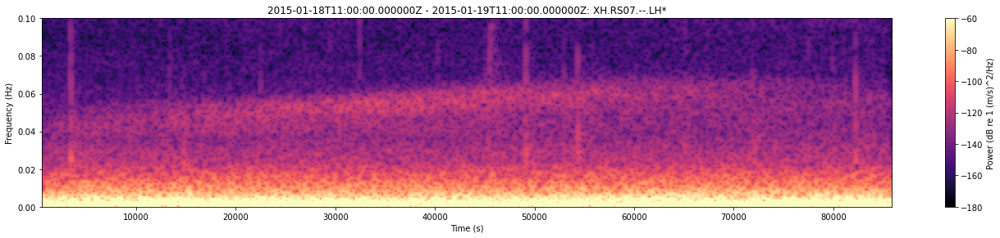

In [169]:
plot_specgram(2, 'Larger')

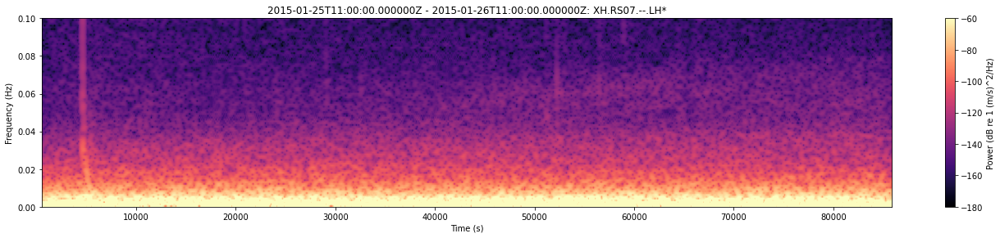

In [161]:
plot_specgram(9, 'Smaller')

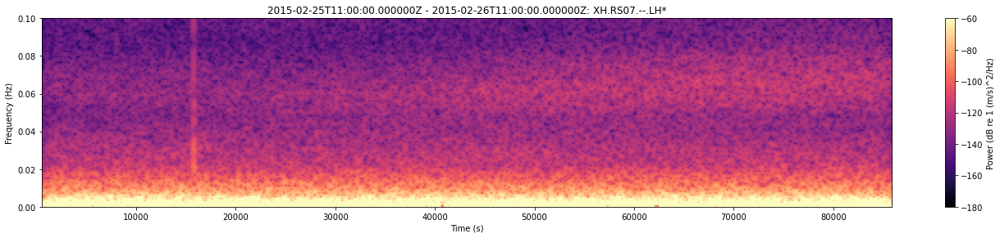

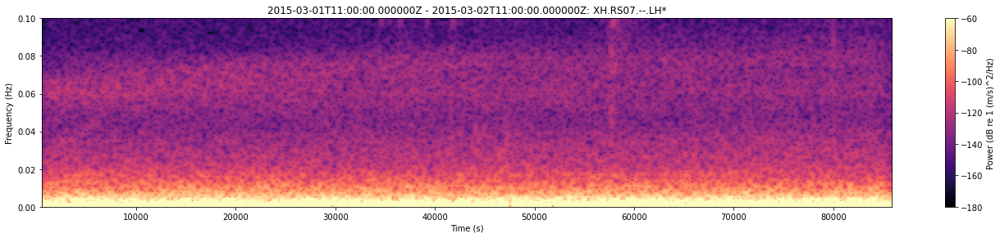

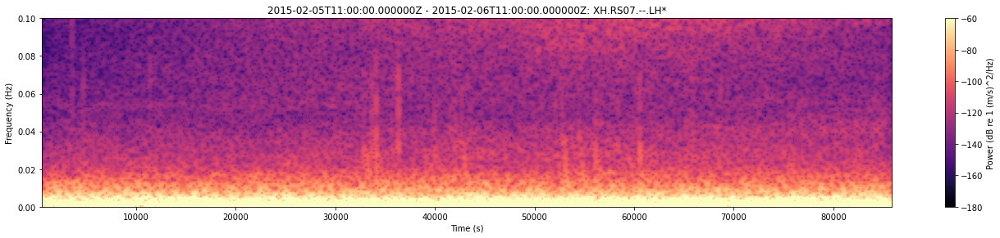

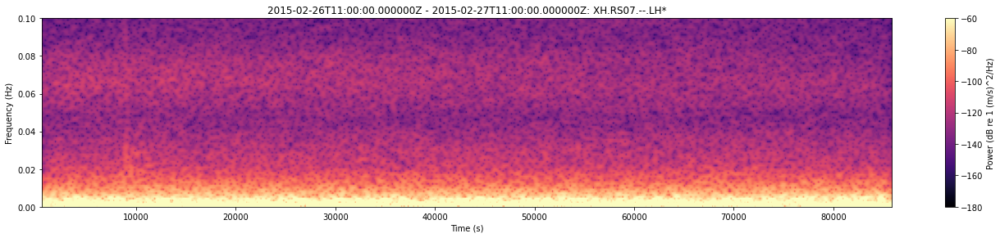

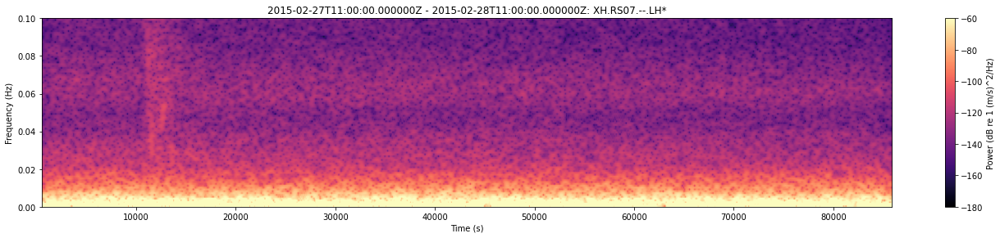

...

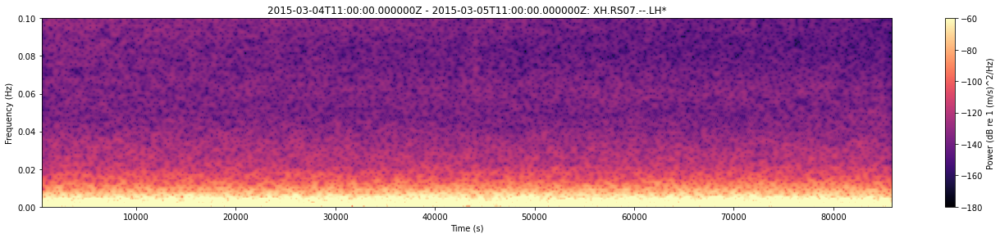

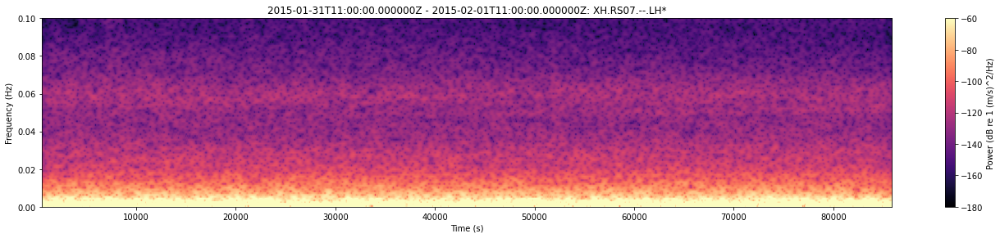

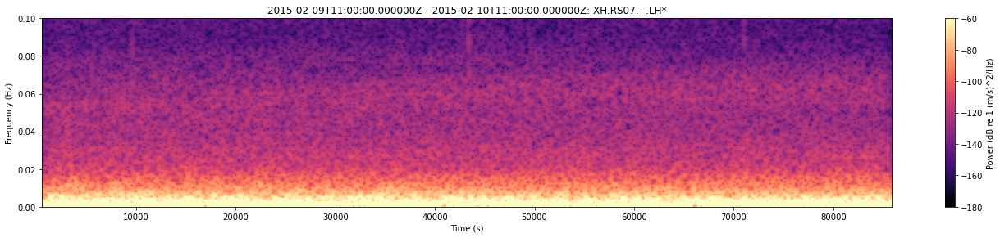

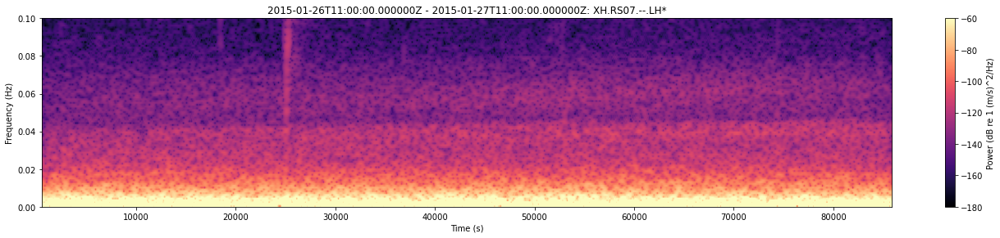

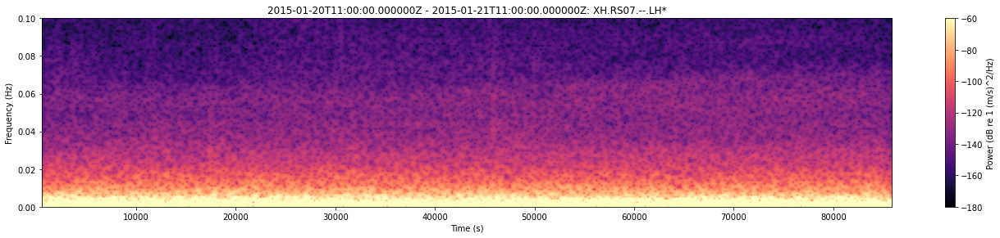

In [165]:
# save all of the smaller and larger spectrograms
for i in reds:
    plot_specgram(i, 'Larger')

for i in greens:
    plot_specgram(i, 'Smaller')

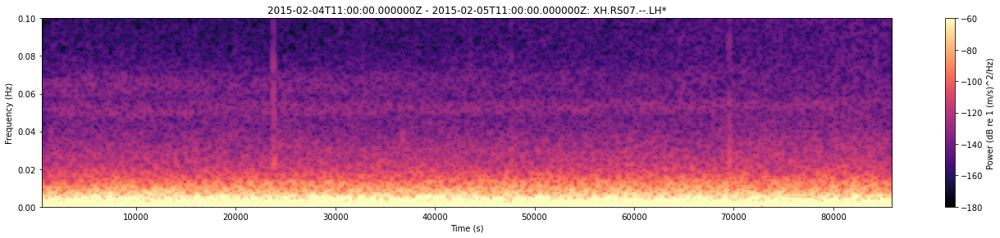

60DayData/SpectrogramComparison/Larger/19.0.png


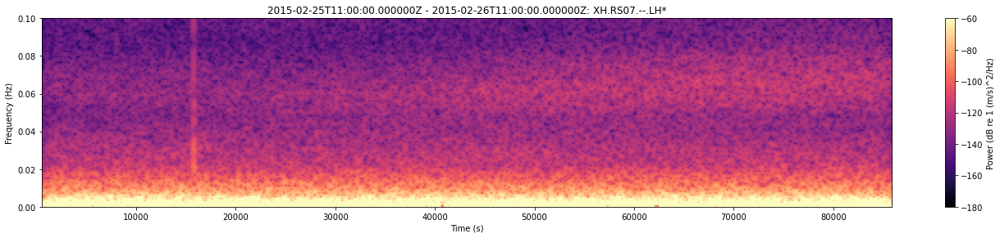

60DayData/SpectrogramComparison/Larger/40.0.png


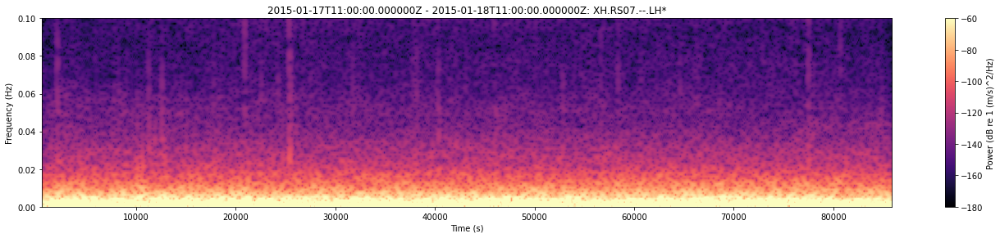

60DayData/SpectrogramComparison/Larger/1.0.png


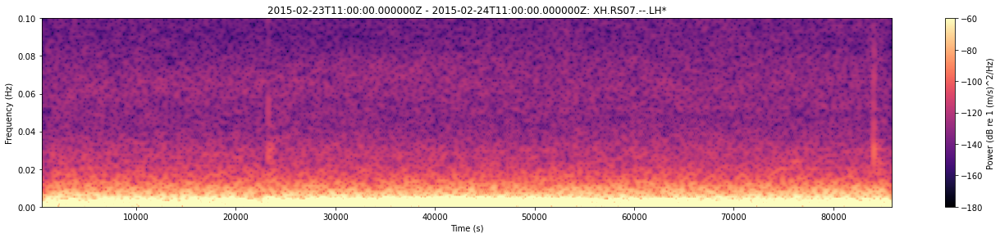

60DayData/SpectrogramComparison/Larger/38.0.png


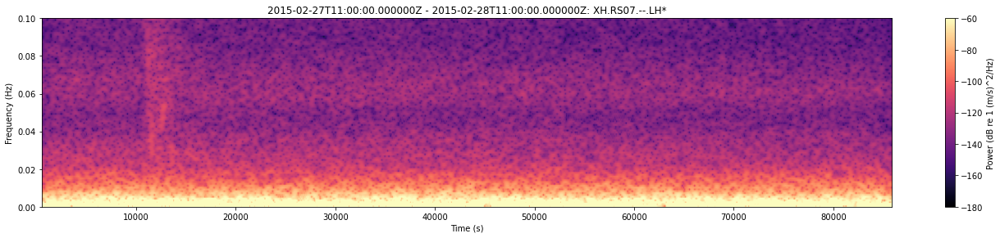

60DayData/SpectrogramComparison/Larger/42.0.png


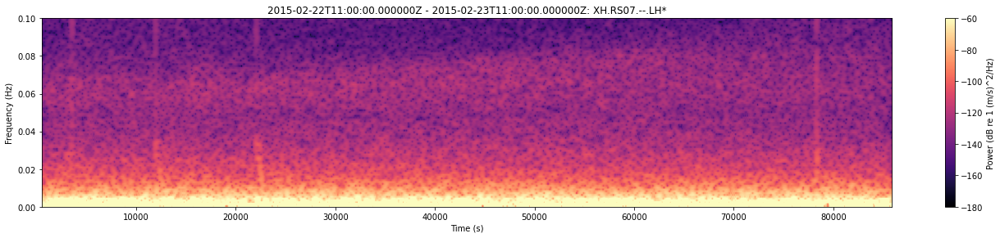

60DayData/SpectrogramComparison/Larger/37.0.png


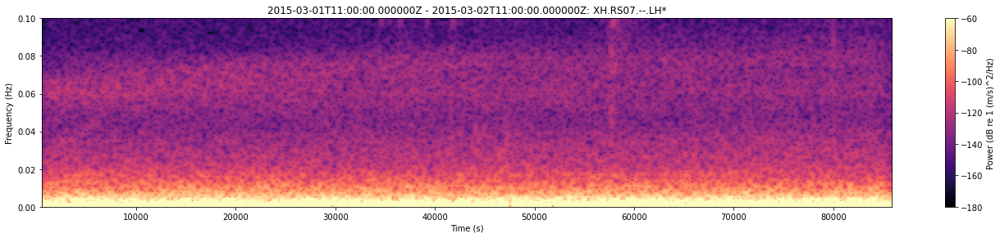

60DayData/SpectrogramComparison/Larger/44.0.png


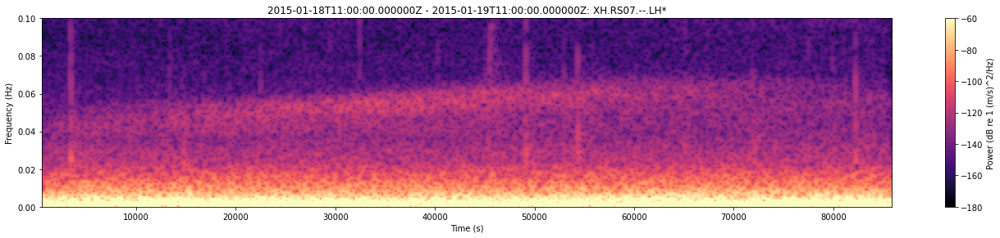

60DayData/SpectrogramComparison/Larger/2.0.png


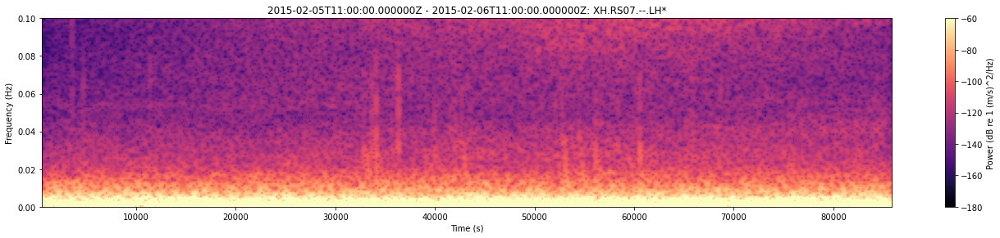

60DayData/SpectrogramComparison/Larger/20.0.png


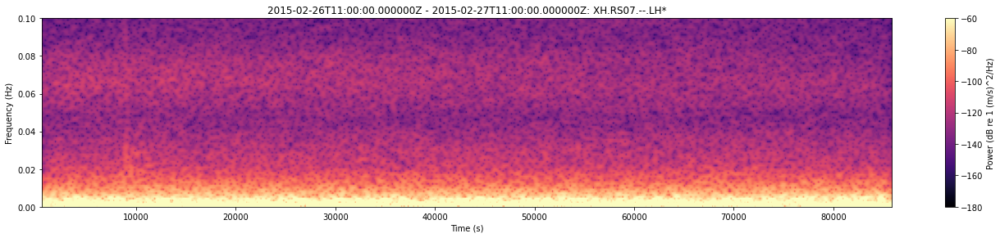

60DayData/SpectrogramComparison/Larger/41.0.png


In [166]:
# display all of the images with larger sizes
for imageName in glob.glob('60DayData/SpectrogramComparison/Larger/*.png'):
    display(Image(filename=imageName))
    print(imageName)

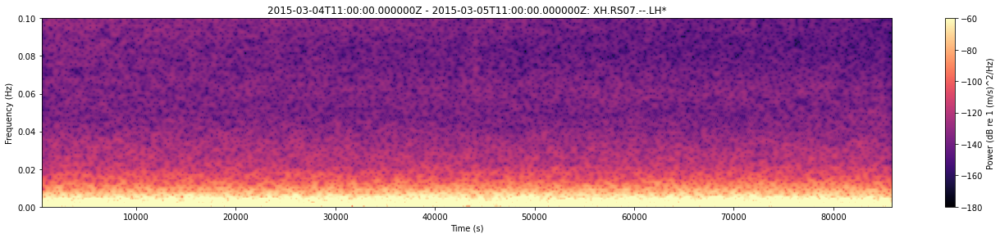

60DayData/SpectrogramComparison/Smaller/47.0.png


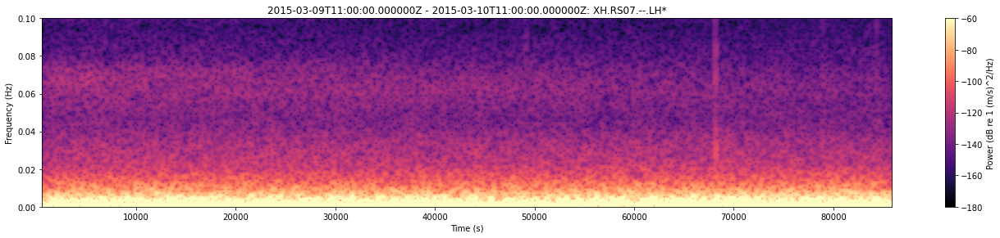

60DayData/SpectrogramComparison/Smaller/52.0.png


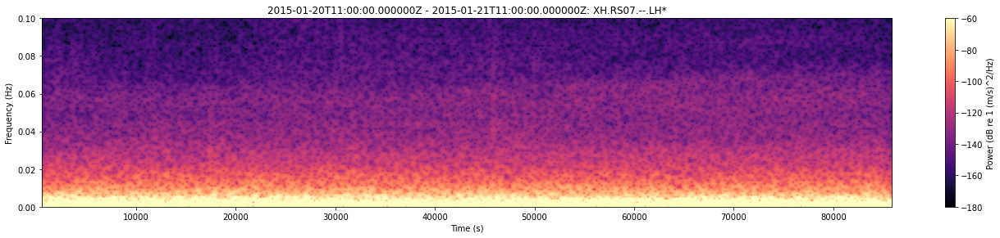

60DayData/SpectrogramComparison/Smaller/4.0.png


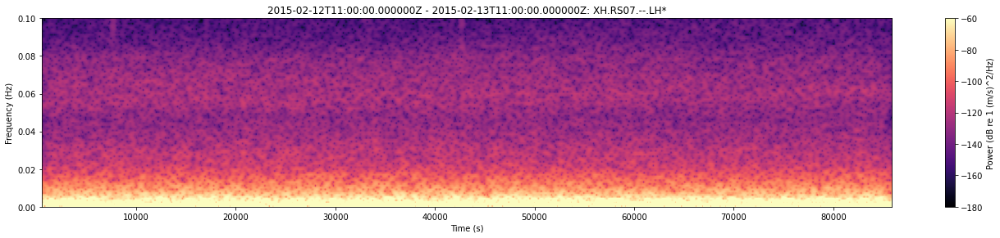

60DayData/SpectrogramComparison/Smaller/27.0.png


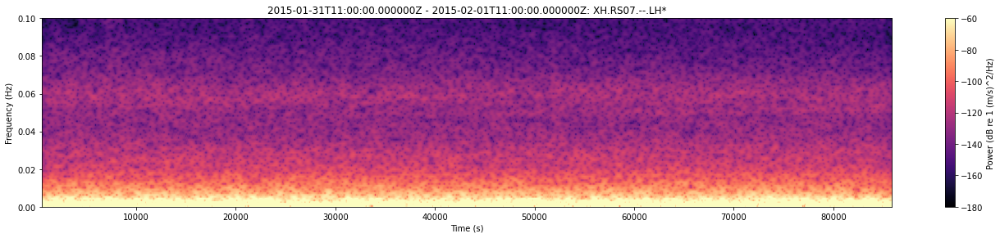

60DayData/SpectrogramComparison/Smaller/15.0.png


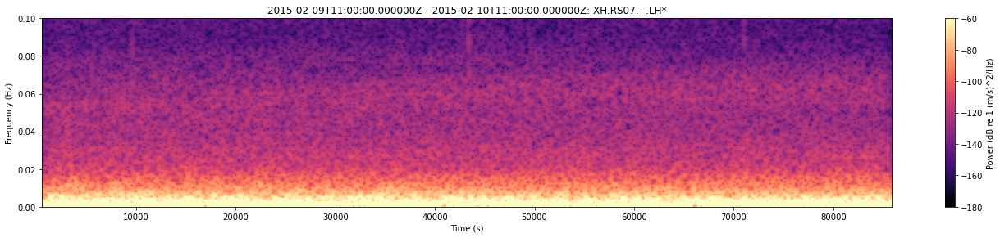

60DayData/SpectrogramComparison/Smaller/24.0.png


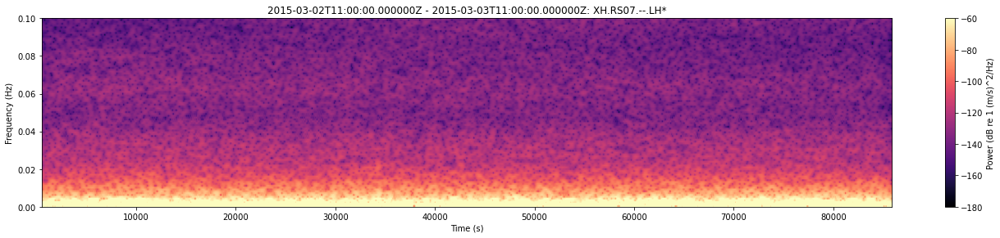

60DayData/SpectrogramComparison/Smaller/45.0.png


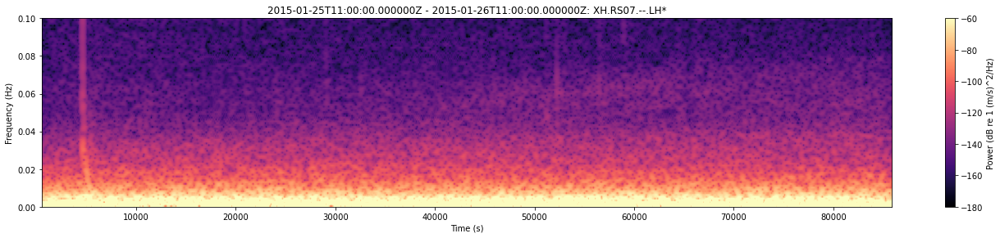

60DayData/SpectrogramComparison/Smaller/9.0.png


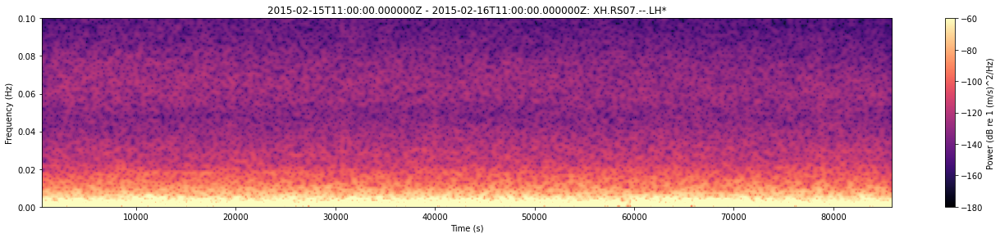

60DayData/SpectrogramComparison/Smaller/30.0.png


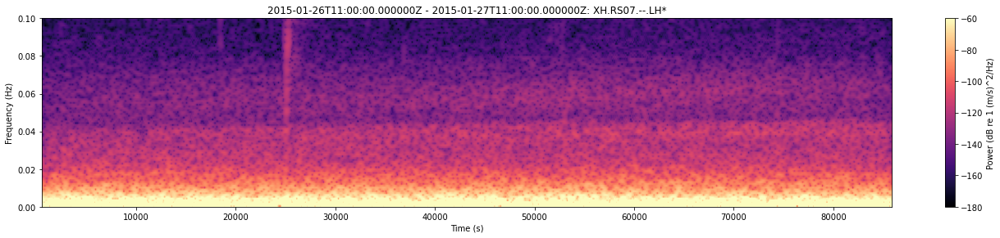

60DayData/SpectrogramComparison/Smaller/10.0.png


In [167]:
# display all of the images with smaller sizes
for imageName in glob.glob('60DayData/SpectrogramComparison/Smaller/*.png'):
    display(Image(filename=imageName))
    print(imageName)

In [175]:
# I will now query the entire 60 day interval at once and see if its size is larger or smaller than the sum of the 
# 60 1 day intervals
one_day_total = sum(data[:,1])
one_day_total

24.309759999999994

In [176]:
# 60 day query
starttime = UTCDateTime('2015-01-17T11:00:00')
endtime = starttime + SECONDS_IN_A_DAY * 60

# querying and saving data
st_60 = client.get_waveforms(net, sta, loc, chan, starttime, endtime, attach_response = True)
st_60.write(filename='60DayData/FullStream.mseed', format="MSEED")

In [177]:
# getting the total size
size = os.path.getsize('60DayData/FullStream.mseed')/(1000000.)
print("Total Size: " + str(size))

Total Size: 23.94112


This makes it pretty clear that the size of the chunks in which you sample the data are nearly insignificant, as a 60 day period is only 0.4 mb smaller than 60 1-day periods. We will do this same experiment with 1 day, and 24 1-hour periods.

In [179]:
# constants
SECONDS_IN_HOUR = 60 * 60
sizes = []

for i in range(24):
    starttime = starttime + SECONDS_IN_HOUR * i
    endtime = starttime + SECONDS_IN_HOUR
    
    st_1h = client.get_waveforms(net, sta, loc, chan, starttime, endtime, attach_response = True)
    st_1h.write(filename='HourlyData/' + str(i) + '.mseed', format="MSEED")
    
    sizes.append(os.path.getsize('HourlyData/' + str(i) + '.mseed')/(1000000.))

In [180]:
# query whole 24 hour period
starttime= UTCDateTime('2015-01-17T11:00:00')
endtime = starttime + SECONDS_IN_A_DAY

st_1d = client.get_waveforms(net, sta, loc, chan, starttime, endtime, attach_response = True)
st_1d.write(filename='HourlyData/OneDay.mseed', format="MSEED")

fullDaySize = os.path.getsize('HourlyData/OneDay.mseed')/(1000000.)
print("1 Day Sample: " + str(fullDaySize))
print("24 1 Hour Samples: " + str(sum(sizes)))

1 Day Sample: 0.458752
24 1 Hour Samples: 0.581632


In [181]:
(sum(sizes) - fullDaySize)/fullDaySize * 100

26.785714285714295

On this smaller time scale, having 1 hour samples really does make a significant difference, since we see a 26.7% decrease in size by storing data in 1 day chunks.

I will now compare the average of 1 day's data with my prediction for 1 day.

In [213]:
# function implementing my equation I derived from my regression
def regression_predict(t, s):
    rv = (0.222757 * s) + (0.001789 * t) - (0.029354 * s**2) + (0.0546 * s * t) + ((0.00004154 * t)**2)
    return rv

# [ 0.00000000e+00  2.22757365e-01  1.78952737e-03 -2.93546667e-02
#   5.46476686e-02  4.15461279e-05]

a0 = regression_predict(3,1)

In [214]:
m = np.mean(X)

In [215]:
# calculating error
(m - a0)/m * 100.

10.512481687154995

This gives 10.5% error, which isn't great, but isn't that bad either.

I will now examine the relationship between size and each of the three variables: number of days, number of traces, and sampling rate.

In [219]:
"""
For this, I will be using previously saved data from RS07. In order to keep everything else constant,
I will only be using streams with three traces of data.
"""

# read in previously saved data.
st_1_1 = read('Data/3T1H.mseed')
st_1_20 = read('Data/3T20H.mseed')
st_1_100 = read('Data/3T100H.mseed')

# get respective file sizes
size_1_1 = os.path.getsize('Data/3T1H.mseed')
size_1_20 = os.path.getsize('Data/3T20H.mseed')
size_1_100 = os.path.getsize('Data/3T100H.mseed')

sizes = [size_1_1, size_1_20, size_1_100]
sampling_rates = [1, 20, 100]

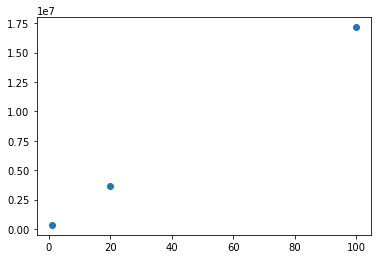

In [220]:
plt.scatter(sampling_rates, sizes)

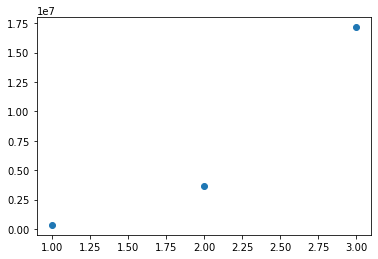

In [221]:
num_traces = [1,2,3]
plt.scatter(num_traces, sizes)

In [223]:
# query longer and longer periods up to 10 days
starttime= UTCDateTime('2015-01-17T11:00:00')
endtime = starttime + SECONDS_IN_A_DAY

day_sizes = []

for i in range(10):
#     querying for data
    st = client.get_waveforms(net, sta, loc, chan, starttime, endtime, attach_response = True)
    
#     saving stream to file
    st.write(filename='MultipleDaySizes/' + str(i) + '.mseed', format="MSEED") 
     
#     updating start and end times
    endtime += SECONDS_IN_A_DAY
    
#     saving the file size in data array
    day_sizes.append((os.path.getsize('MultipleDaySizes/' + str(i) + '.mseed'))/(1000000.))

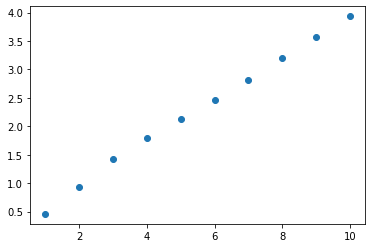

In [236]:
num_days = list(range(1,11))
plt.scatter(num_days, day_sizes)

Thus, we see that the relationship looks linear w.r.t. to sampling rate, quadratic w.r.t. to the number of traces, and linear w.r.t. to the number of days.